#### Exploratory Data Analysis
This notebook contains the exploratory data analysis performed on the training dataset provided by Allstate to predict insurance claim severity, analysis is performed on the following topics
1. Training and testing dataset statistics
2. missing values
3. distribution of continuous features and transformation if necessary

Based on the analysis of feature transformation, best possible feature is picked for preprocessing.

In [1]:
# loading required modules
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import math
%matplotlib inline

In [2]:
# load train and test dataset
train = pd.read_csv(r"C:\Users\piush\Desktop\Dataset\Allstate\train.csv")
test = pd.read_csv(r"C:\Users\piush\Desktop\Dataset\Allstate\test.csv")

In [3]:
# printing train dataset information
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [4]:
# printing test dataset information
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(1), object(116)
memory usage: 125.5+ MB


In [5]:
train.columns[train.isnull().sum() > 0 ]

Index([], dtype='object')

In [6]:
# setting pandas env variables to display max rows and columns
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows',1000)

In [7]:
# describing statistics of continuous variables
train.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,294135.982561,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.084867,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,1.000000,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,147748.250000,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,294539.500000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,440680.500000,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,587633.000000,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


In [8]:
# describing statistics of categorical variables
train.describe(include = ['object'])

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
count,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326
top,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK
freq,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061


In [9]:
# sepearte the categorical and continous features
cont_columns = []
cat_columns = []

for i in train.columns:
    if train[i].dtype == 'float':
        cont_columns.append(i)
    elif train[i].dtype == 'object':
        cat_columns.append(i)

In [10]:
# log transform the label variable
train['loss'] = np.log1p(train['loss'])


C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


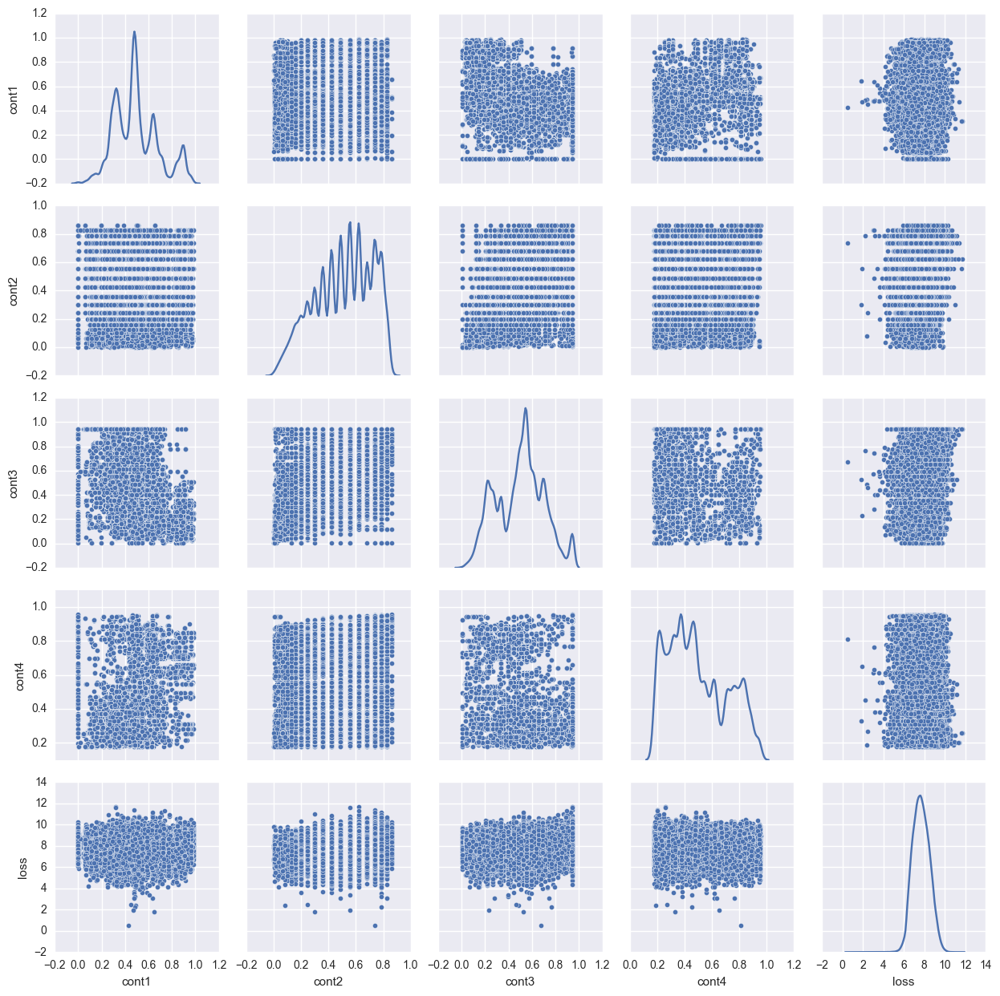

In [11]:
sns.pairplot(train[cont_columns], vars=['cont1','cont2','cont3','cont4','loss'], kind = 'scatter',diag_kind='kde')

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


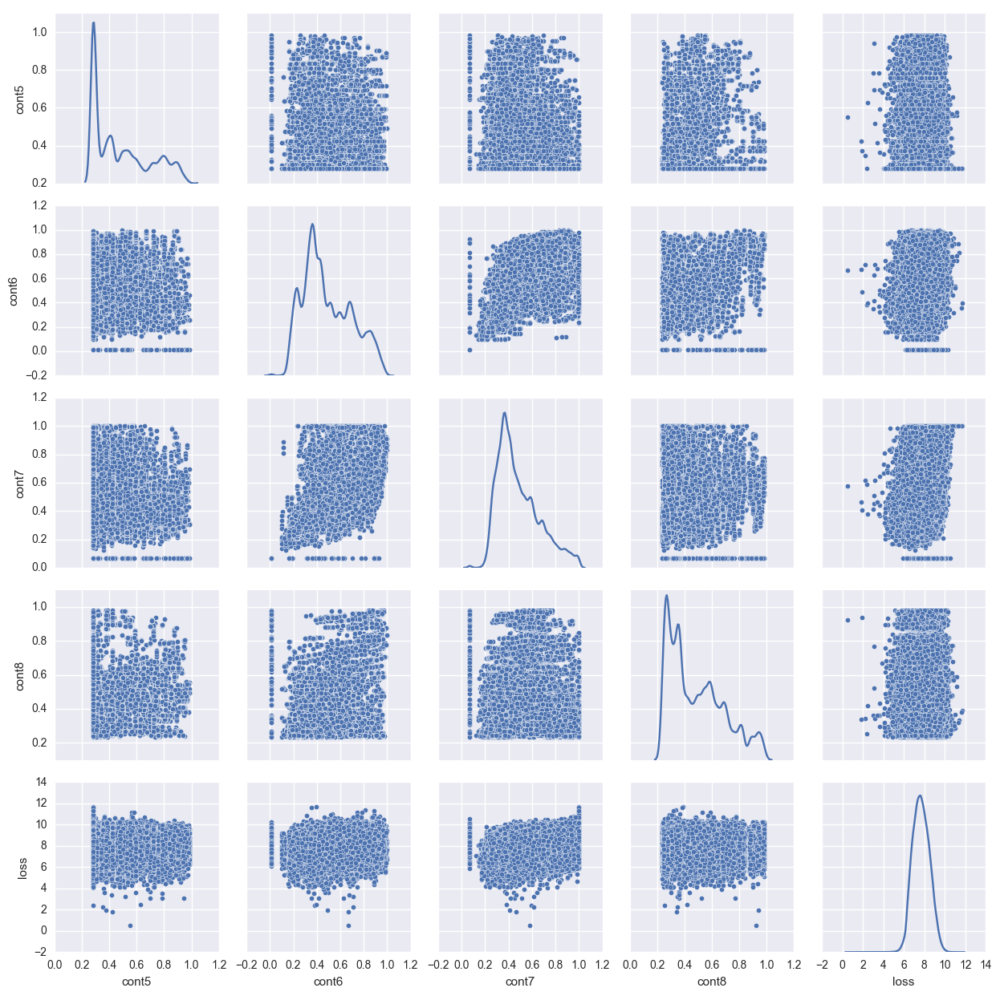

In [12]:
sns.pairplot(train[cont_columns], vars=['cont5','cont6','cont7','cont8','loss'], kind = 'scatter',diag_kind='kde')

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


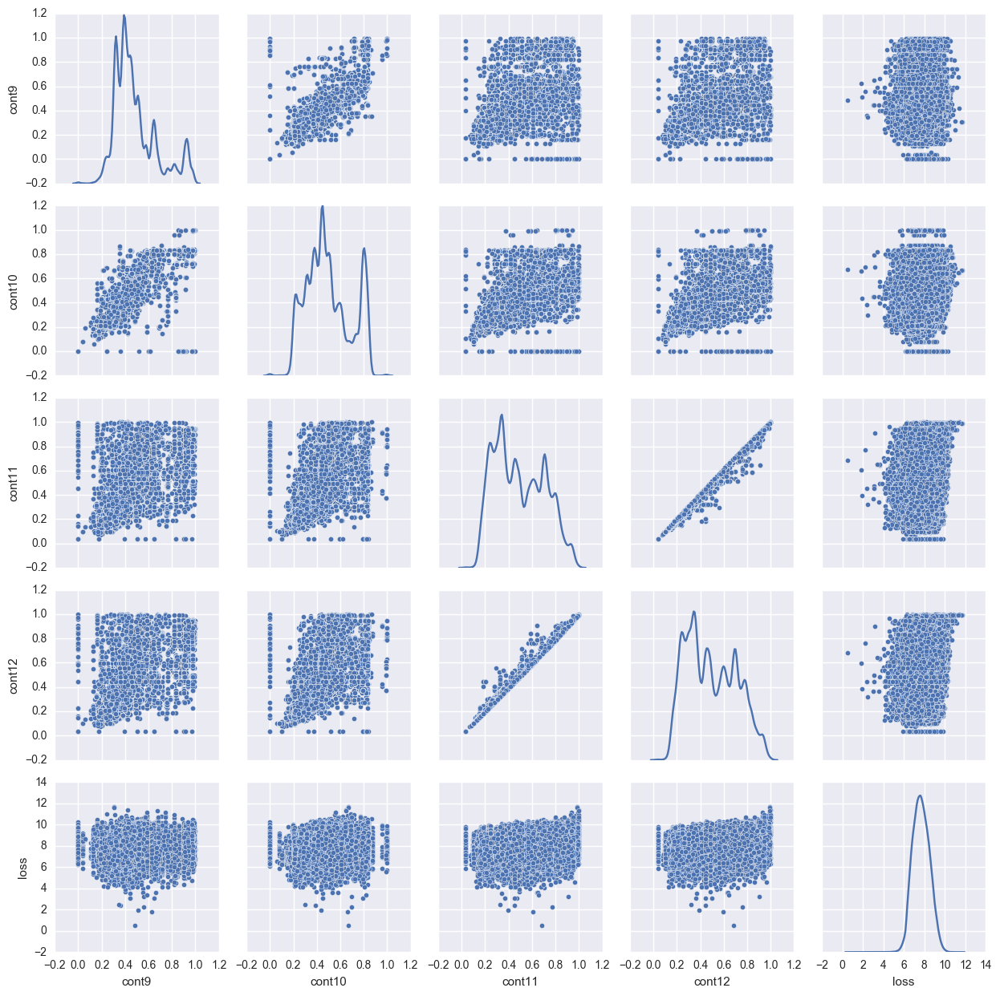

In [13]:
sns.pairplot(train[cont_columns], vars=['cont9','cont10','cont11','cont12','loss'], kind = 'scatter',diag_kind='kde')

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


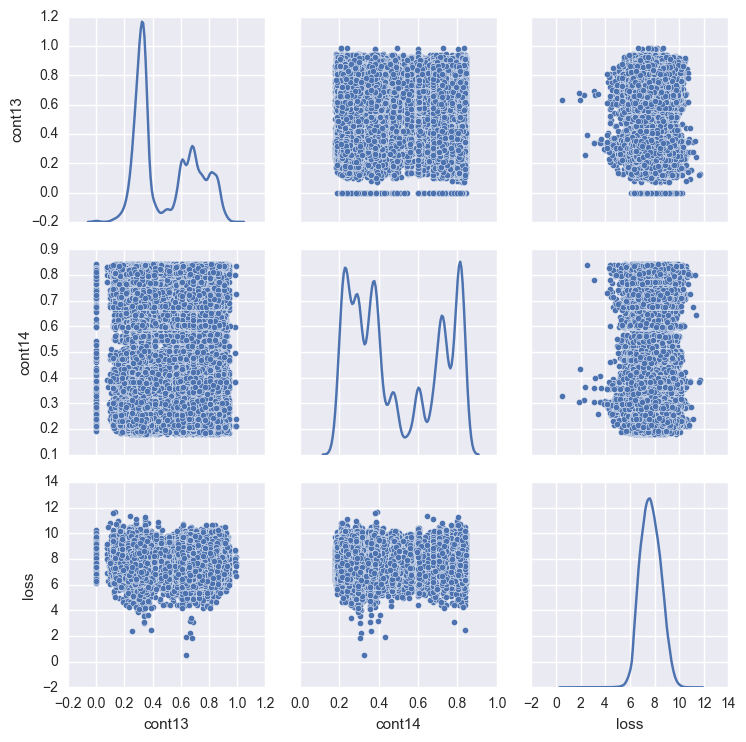

In [14]:
sns.pairplot(train[cont_columns], vars=['cont13','cont14','loss'], kind = 'scatter',diag_kind='kde')

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


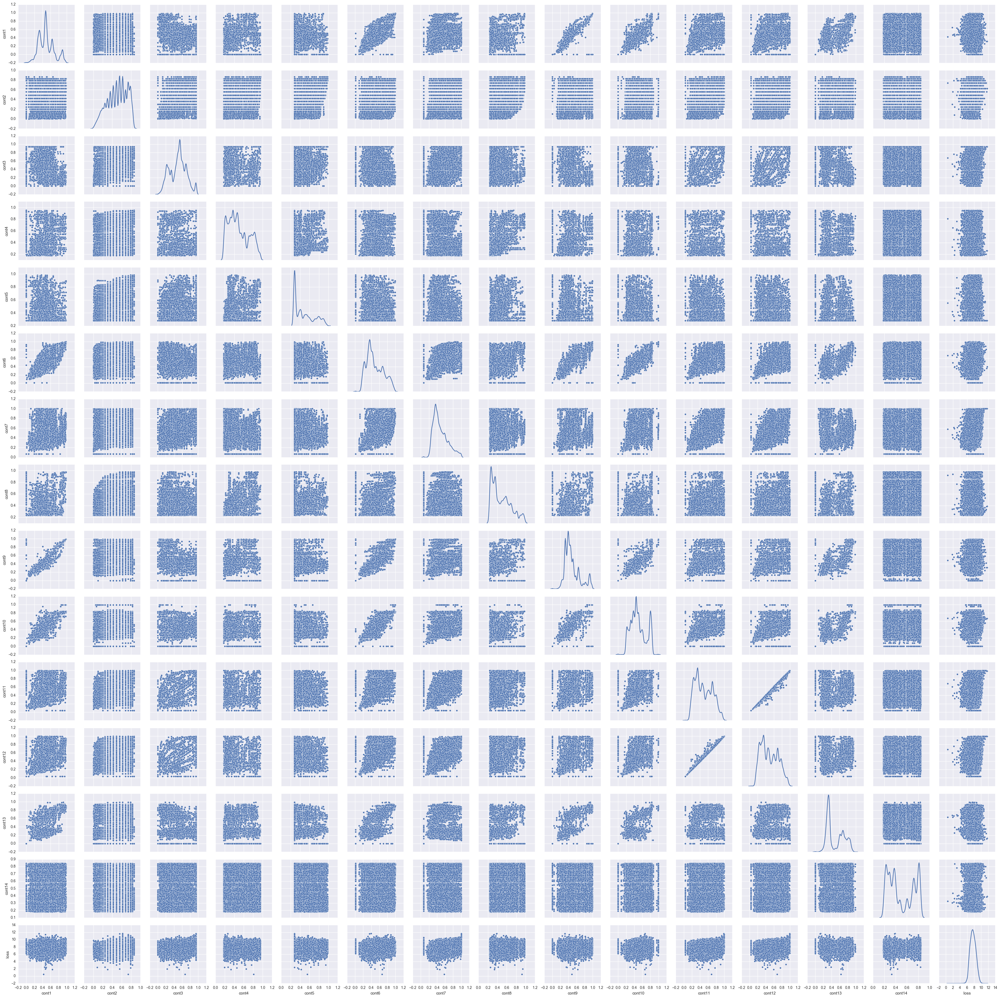

In [15]:
sns.pairplot(train[cont_columns], kind = 'scatter',diag_kind='kde')

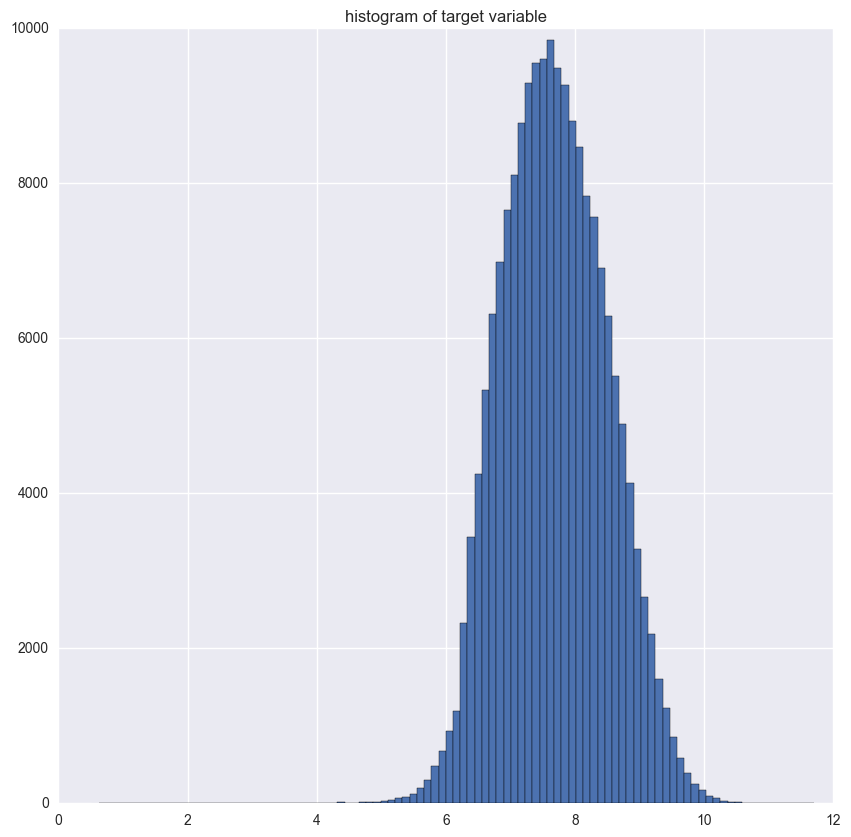

In [16]:
plt.figure(figsize=(10,10))
plt.hist(train.loss, bins=100)
plt.title("histogram of target variable")
plt.show()

In [17]:
# Compute the correlation matrix
corr = train[cont_columns].corr()

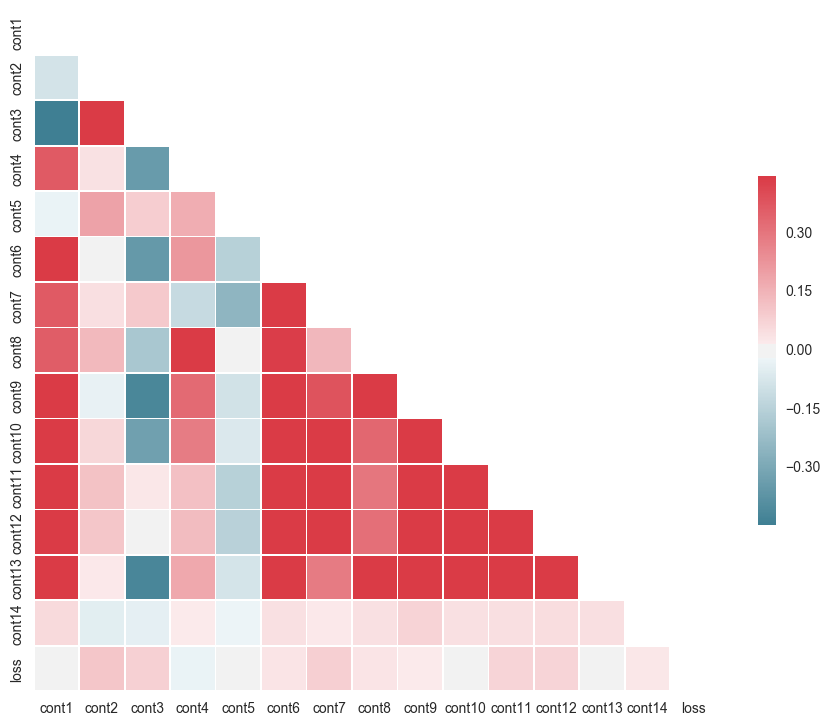

In [18]:
sns.set(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

In [19]:
cont_columns.remove('loss')

#### Let's look at the probability plot of continuous variables

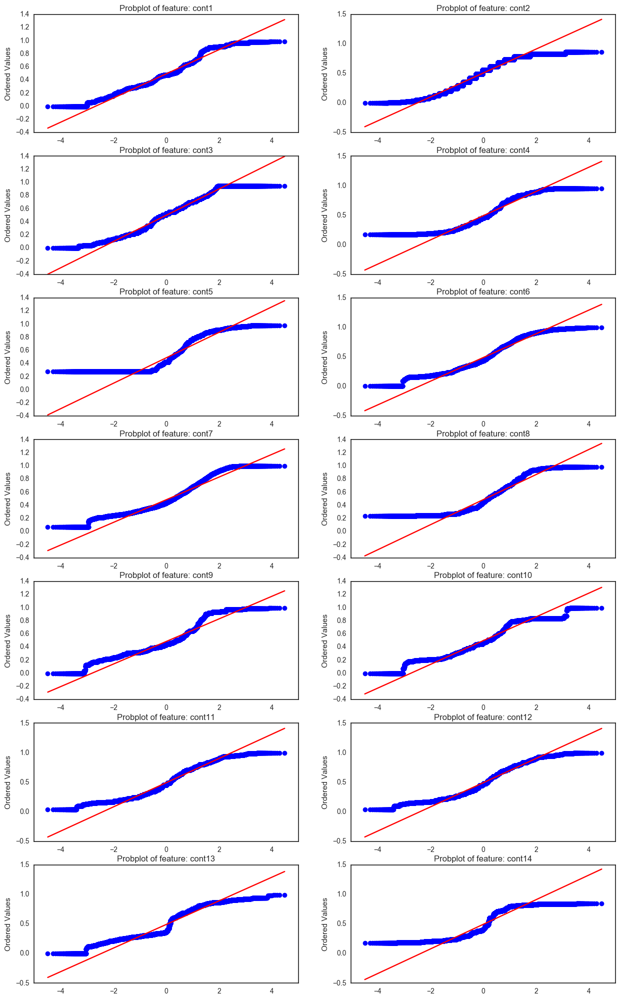

In [20]:
import matplotlib.gridspec as gridspec
from scipy import stats

plt.figure(figsize=(15,25))
gs = gridspec.GridSpec(7, 2)
for i, cn in enumerate(train[cont_columns].columns):
    ax = plt.subplot(gs[i])
    stats.probplot(train[cn], dist = stats.norm, plot = ax)
    ax.set_xlabel('')
    ax.set_title('Probplot of feature: cont' + str(i+1))
plt.show()

#### Let's look at the skewness and plot them.

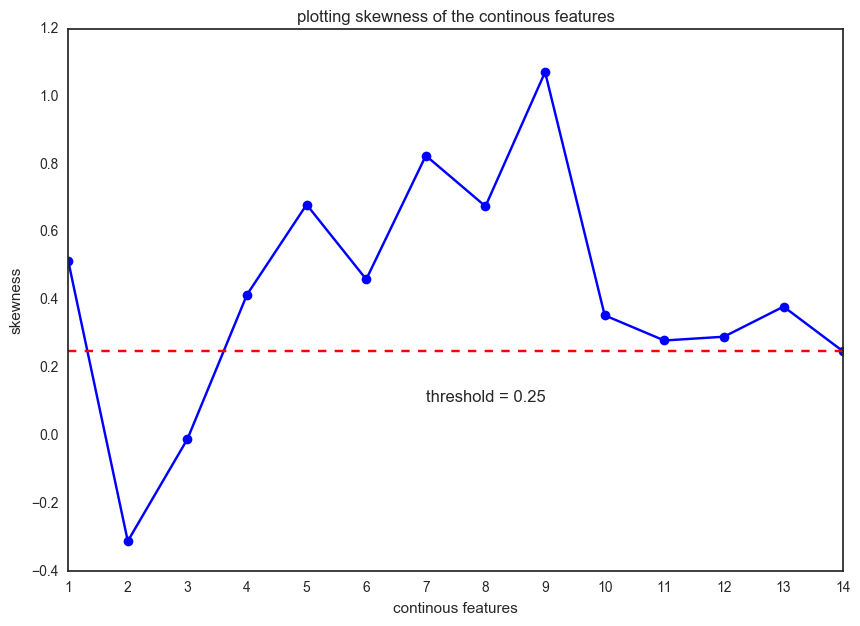

In [21]:
skewness_list = []
for cn in train[cont_columns].columns:
    skewness_list.append(stats.skew(train[cn]))

plt.figure(figsize=(10,7))
plt.plot(skewness_list, 'bo-')
plt.xlabel("continous features")
plt.ylabel("skewness")
plt.title("plotting skewness of the continous features")
plt.xticks(range(15), range(1,15,1))
plt.plot([(0.25) for i in range(0,14)], 'r--')
plt.text(6, .1, 'threshold = 0.25')
plt.show()

###### Except couple of features, all of them have skewness above 0.25, let's look at their distribution and experiment with different transformations.

In [22]:
skewed_cont_columns = []
for i, cn in enumerate(cont_columns):
    if skewness_list[i] >= 0.25:
        skewed_cont_columns.append(cn)

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


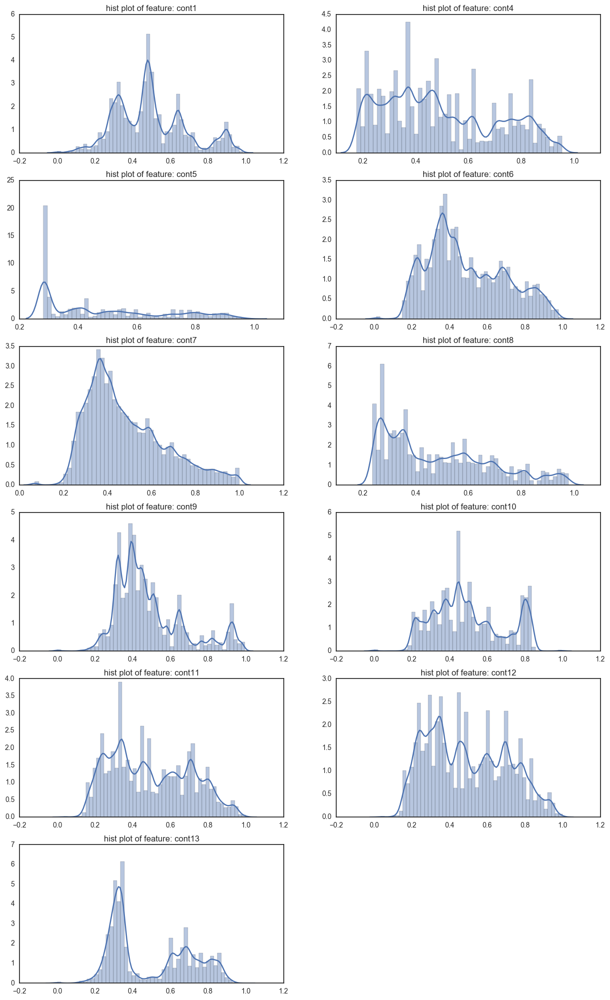

In [23]:
plt.figure(figsize=(15,25))
gs = gridspec.GridSpec(6, 2)
for i, cn in enumerate(skewed_cont_columns):
    ax = plt.subplot(gs[i])
    sns.distplot(train[cn], bins=50)
    ax.set_xlabel('')
    ax.set_title('hist plot of feature: ' + str(cn))
plt.show()

### Below function comes in handy in plotting the distribution and probability plot side by side and we look at
1. original feature
2. custom transformed feature
3. boxcox transformed feature

in some cases custom transformation might be better than boxcox transformation, let's analyze.

In [25]:
def examine_transform(original, transformed):
    plt.figure(figsize=(15,10))
    gs = gridspec.GridSpec(3,2, width_ratios=(1,2))
    
    ax = plt.subplot(gs[0])
    sns.distplot(original, bins=50)
    ax.set_xlabel('')
    ax.set_title('histogram of orignal feature')
    
    ax = plt.subplot(gs[1])
    prob = stats.probplot(original, dist = stats.norm, plot = ax)
    ax.set_xlabel('')
    ax.set_title('Probplot of original feature')
    
    ax = plt.subplot(gs[2])
    sns.distplot(transformed, bins=50)
    ax.set_xlabel('')
    ax.set_title('histogram of transformed feature')
    
    ax = plt.subplot(gs[3])
    prob = stats.probplot(transformed, dist = stats.norm, plot = ax)
    ax.set_xlabel('')
    ax.set_title('Probplot of transformed feature')
    
    # apply boxcox transformation
    xt, _ = stats.boxcox(original)
    ax = plt.subplot(gs[4])
    sns.distplot(xt, bins=50)
    ax.set_xlabel('')
    ax.set_title('histogram of boxcox transformed feature')
    
    ax = plt.subplot(gs[5])
    prob = stats.probplot(xt, dist = stats.norm, plot = ax)
    ax.set_xlabel('')
    ax.set_title('Probplot of boxcox transformed feature')
    
    
    plt.show()



C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


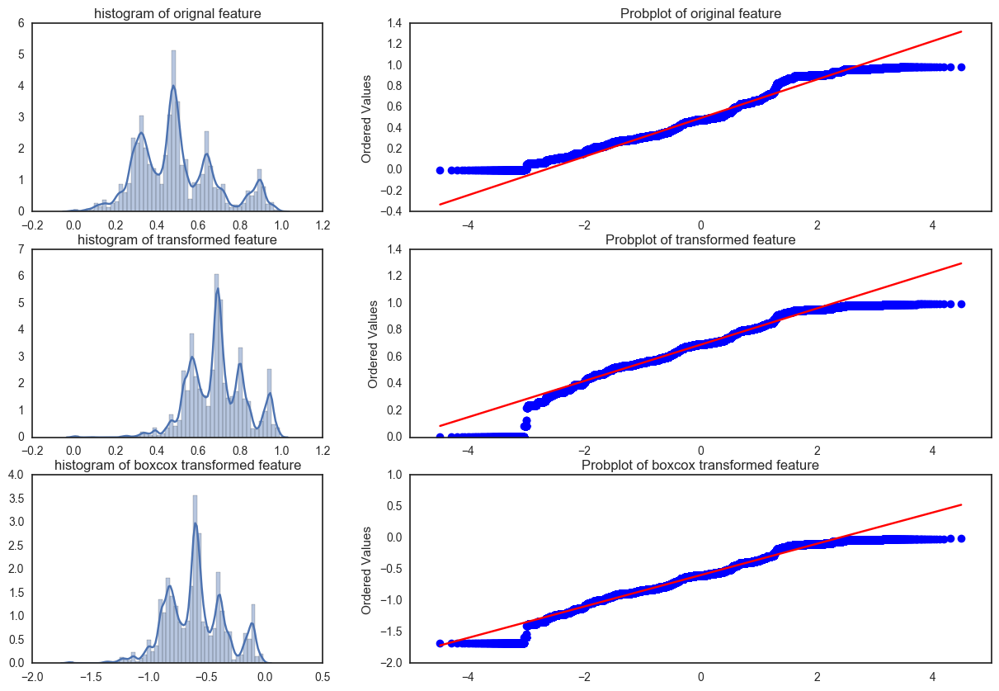

In [26]:
examine_transform(train.cont1, np.power(train.cont1,0.5))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


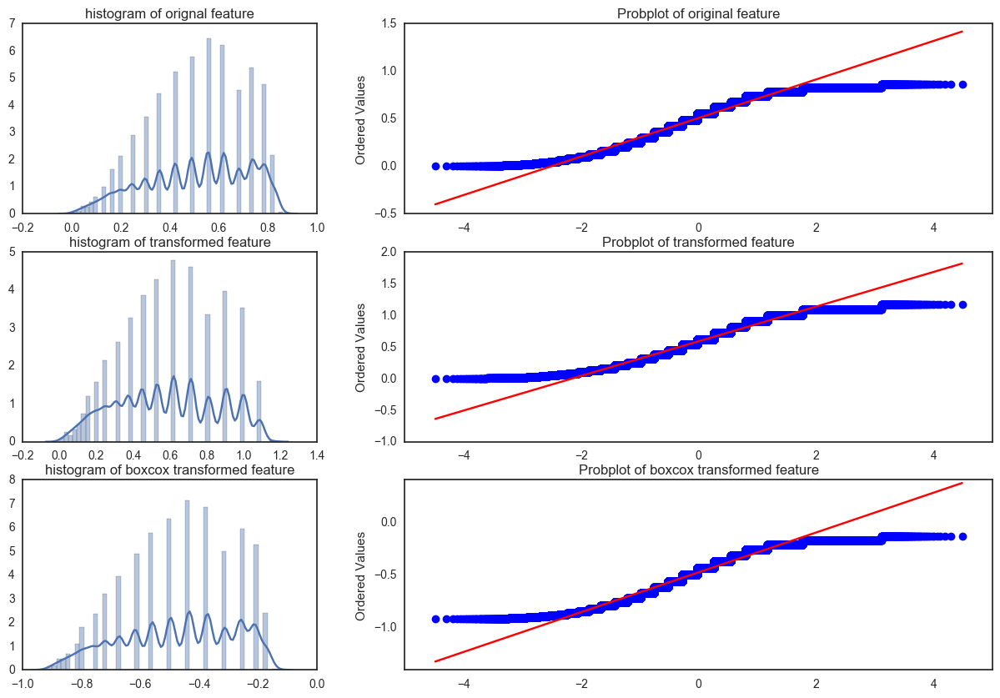

In [27]:
examine_transform(train.cont2, np.tan(train.cont2))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


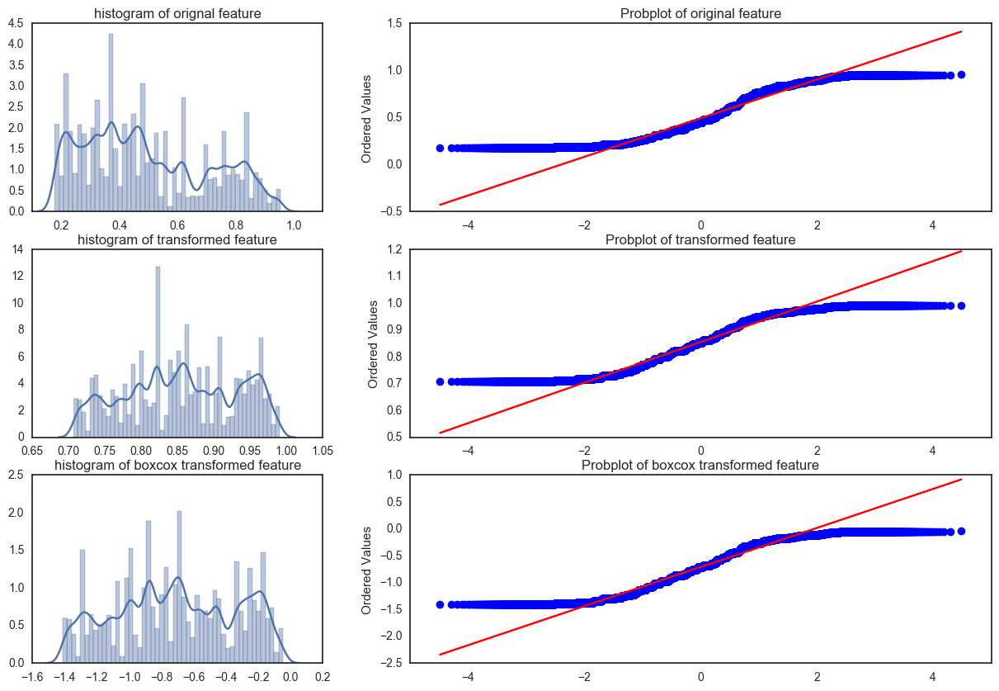

In [28]:
examine_transform(train.cont4, np.power(train.cont4,0.2))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


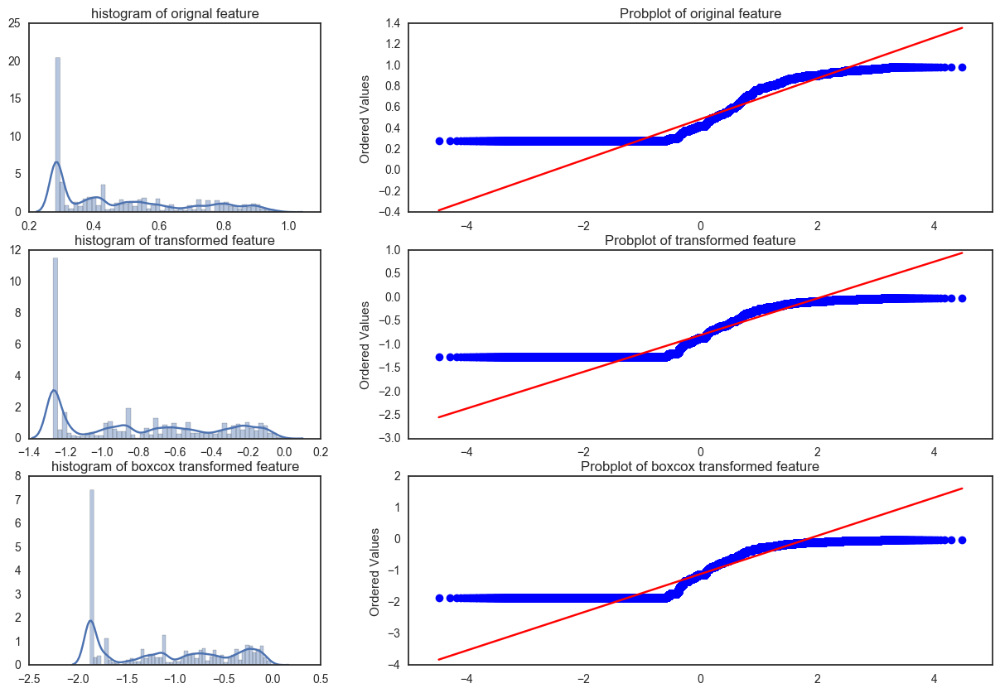

In [29]:
examine_transform(train.cont5, np.log(train.cont5))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


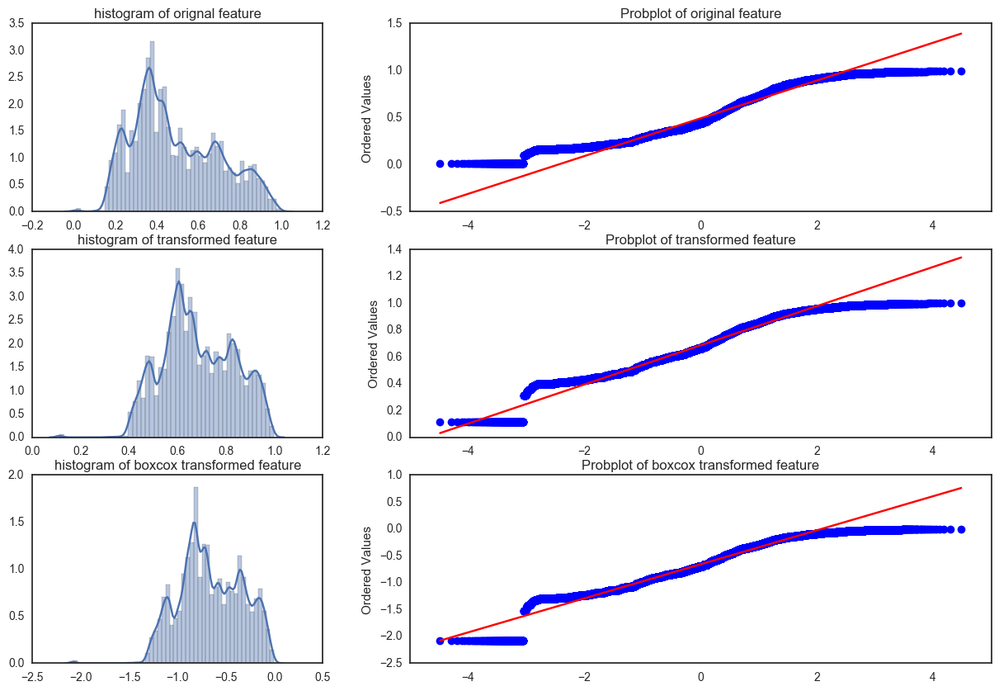

In [30]:
examine_transform(train.cont6, np.power(train.cont6,0.5))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


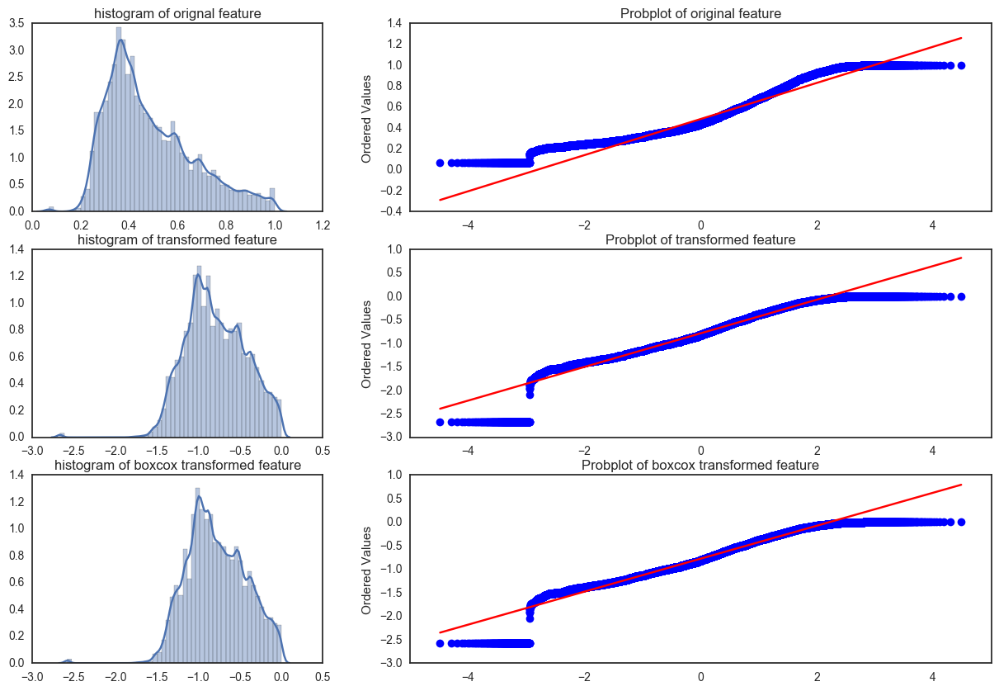

In [31]:
examine_transform(train.cont7, np.log(train.cont7))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


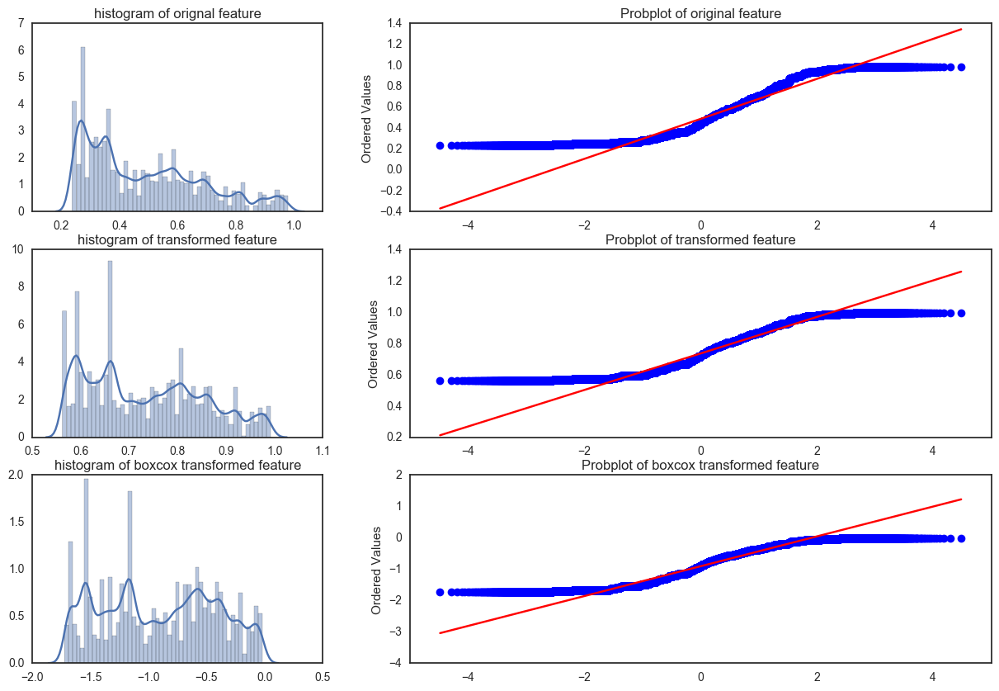

In [32]:
examine_transform(train.cont8, np.power(train.cont8,0.4))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


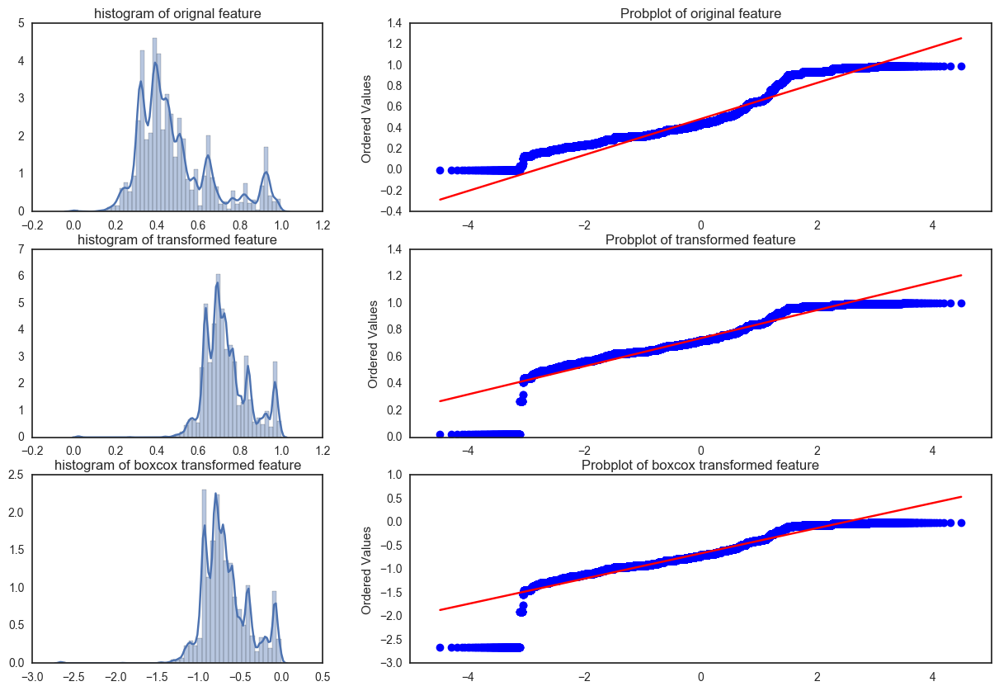

In [33]:
examine_transform(train.cont9, np.power(train.cont9,0.4))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


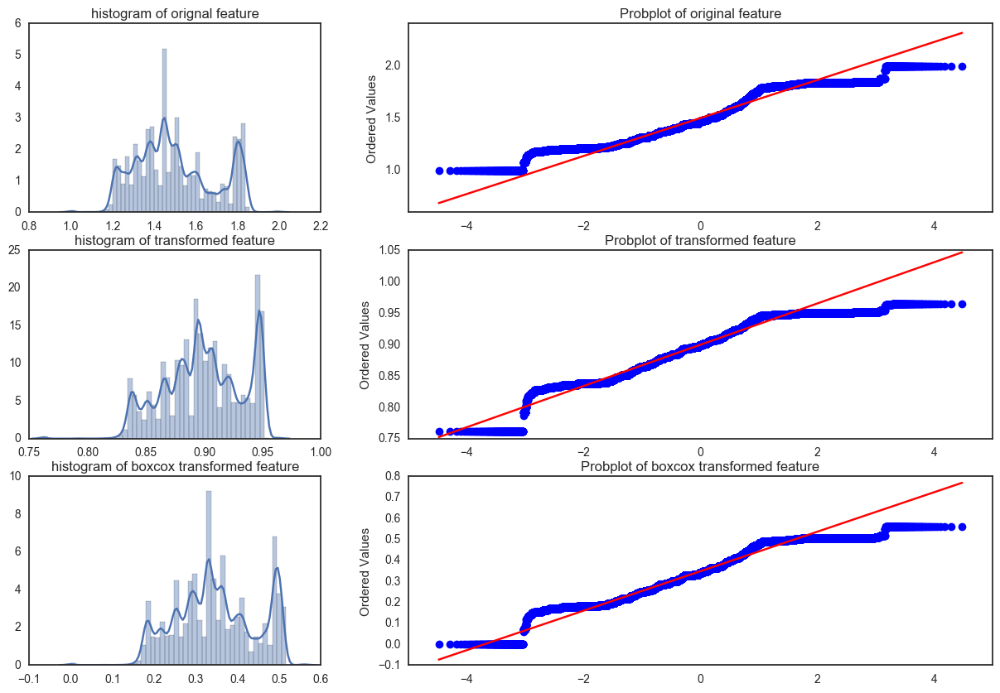

In [34]:
examine_transform(train.cont10+1, np.tanh(train.cont10+1))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


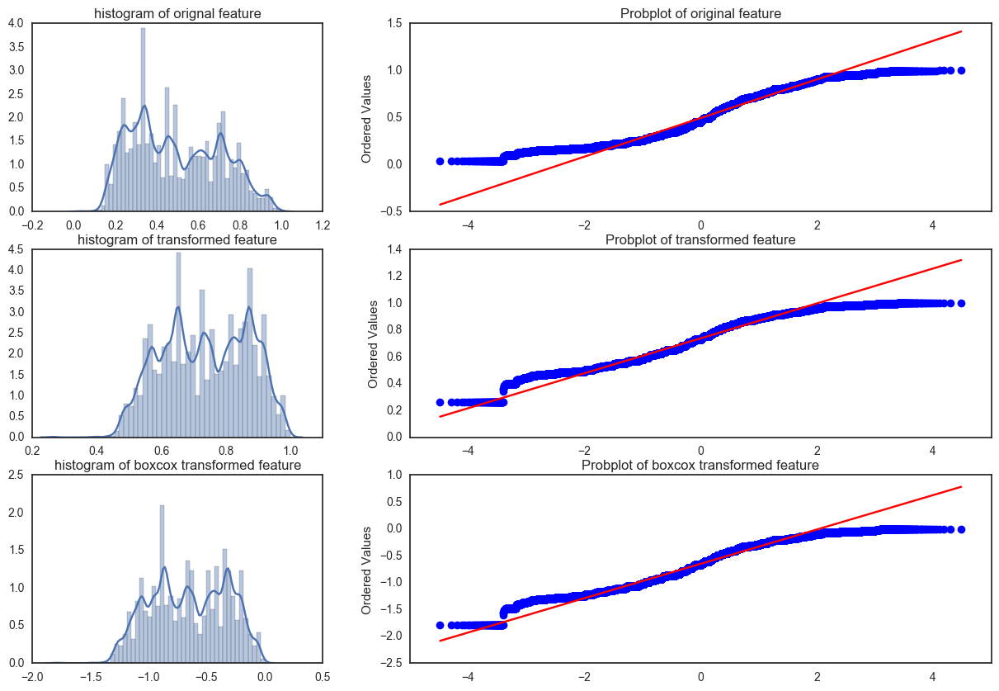

In [36]:
examine_transform(train.cont11, np.power(train.cont11,0.4))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


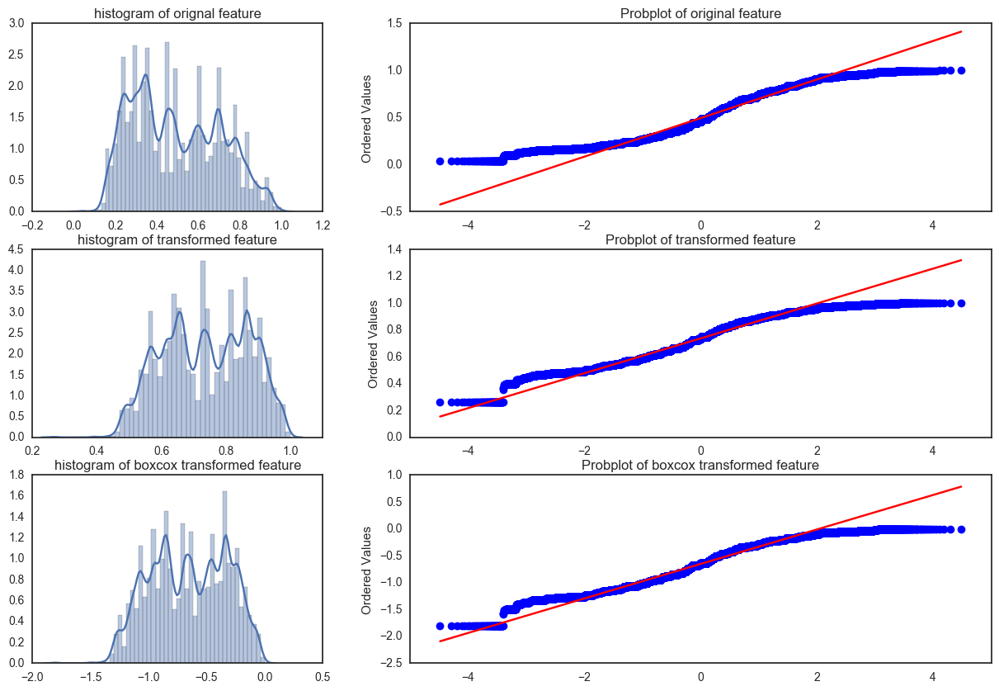

In [37]:
examine_transform(train.cont12, np.power(train.cont12,0.4))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


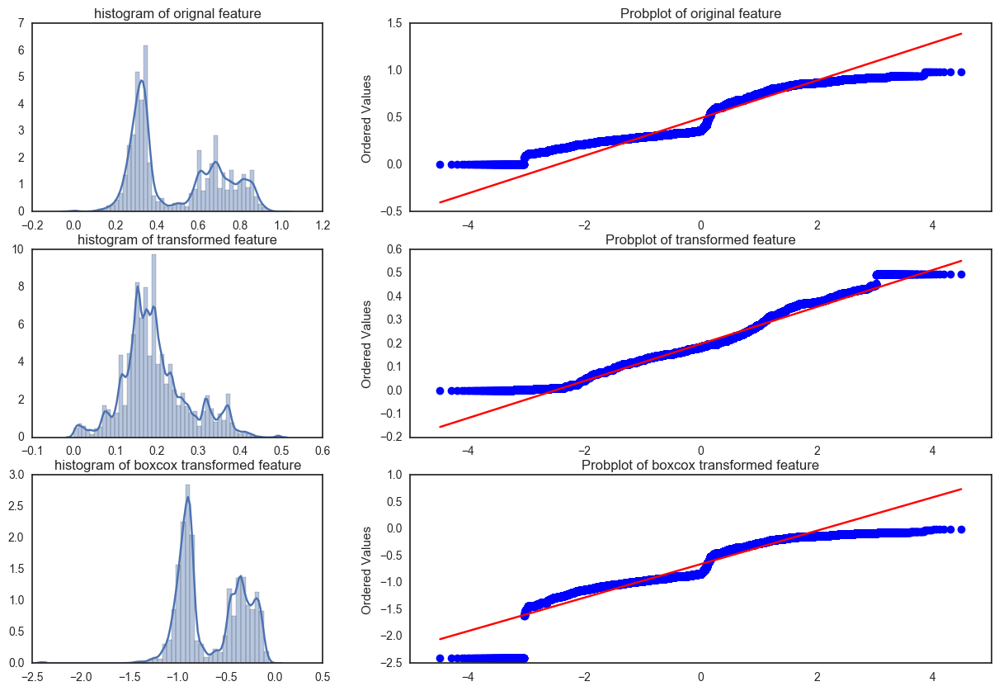

In [38]:
examine_transform(train.cont13, np.abs(train.cont13 - np.mean(train.cont13)))

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


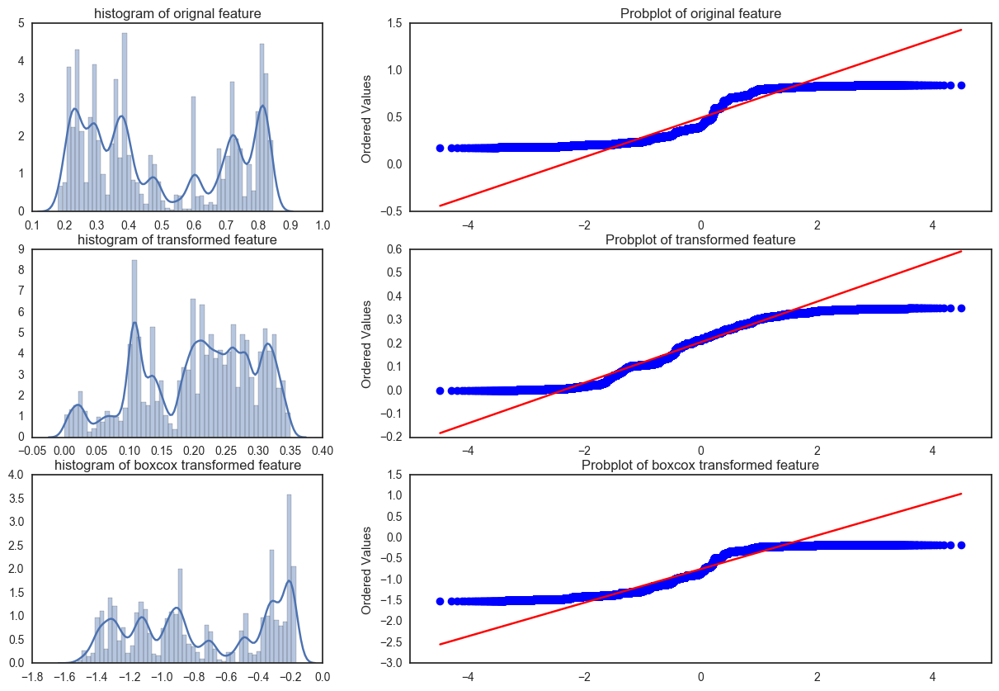

In [39]:
examine_transform(train.cont14, np.abs(train.cont14 - np.mean(train.cont14)))

In [40]:
# here is the pick of the transformation based on the above analysis
feature_transformation = {  'cont1': 'boxcox'
                          , 'cont2': 'np.tan'
                          , 'cont3': 'none'
                          , 'cont4': 'boxcox'
                          , 'cont5': 'boxcox'
                          , 'cont6': 'boxcox'
                          , 'cont7': 'boxcox'
                          , 'cont8': 'boxcox'
                          , 'cont9': 'boxcox'
                          , 'cont10': 'boxcox'
                          , 'cont11': 'boxcox'
                          , 'cont12': 'boxcox'
                          , 'cont13': 'abs_mean_shift'
                          , 'cont14': 'abs_mean_shift'
                         }

BoxCox transformation ( https://www.isixsigma.com/tools-templates/normality/making-data-normal-using-box-cox-power-transformation/ )

various transformations
such as

1. power transformations (square, cube, sqrt, cube root, etc.,)
2. log (different base)
3. trigonometric functions (sine, cosine, tan)
4. absolute mean shifting (seems to work good for bi modal distributions)

since cont13 and cont14 are slightly bi modal, absolute mean shift worked well there in transforming them close to normal distribution. I will be interested in finding out what would be underlying cause of bi modal nature.

###### evaluation criteria:
I was using R2 value from the probability plot and the transformed distribution (histogram) as a evaluation criteria to pick between the transforms.

You can think of few more options like signal transformations (Fourier transforms etc.,)

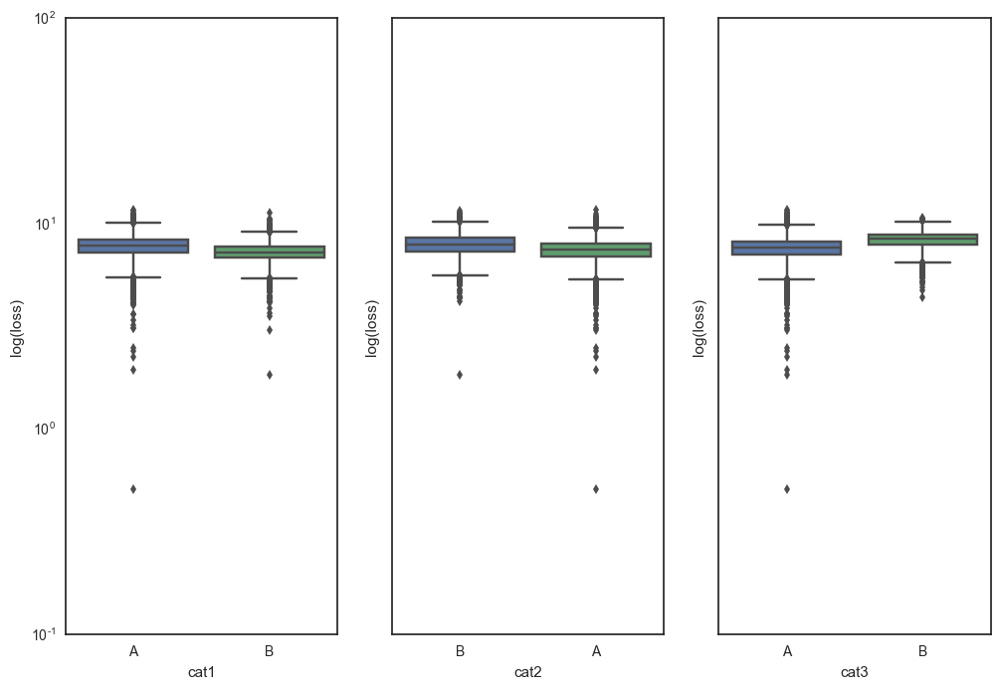

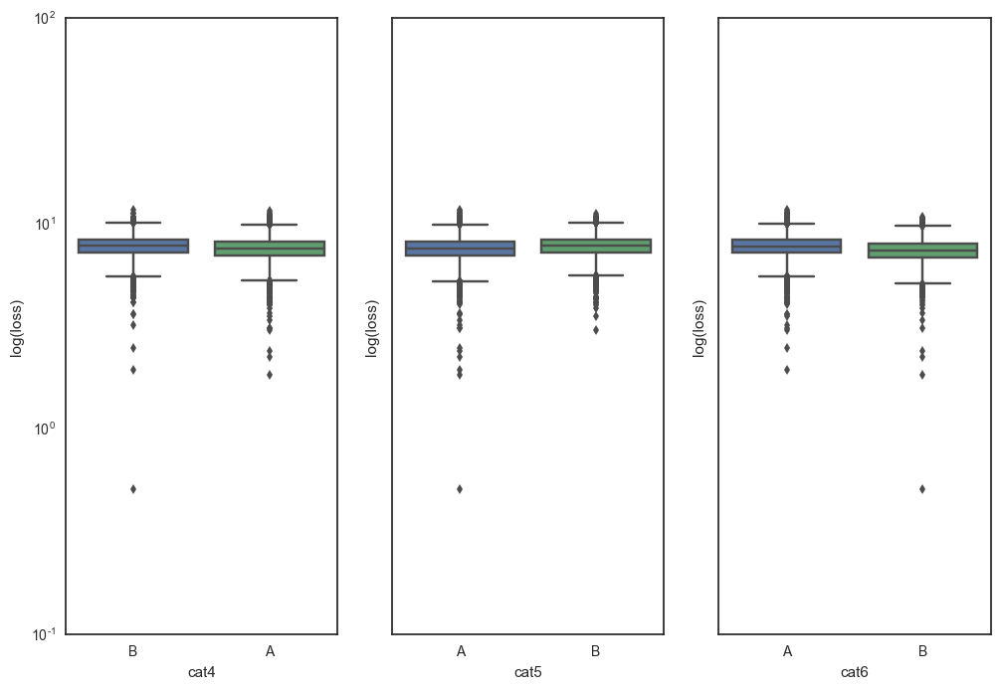

In [42]:
## Boxplots for categorical columns

ncol = 3
nrow = 2
for i in range(nrow):
    fig,axs = plt.subplots(nrows=1,ncols=ncol,sharey=True,figsize=(12, 8))
    cols = cat_columns[i*ncol:ncol*(i+1)]
    for i in range(len(axs)):
        axs[i].set(yscale="log")
        sns.boxplot(x=cols[i], y="loss", data=train, ax=axs[i])
        axs[i].set(xlabel=cols[i], ylabel='log(loss)')

C:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


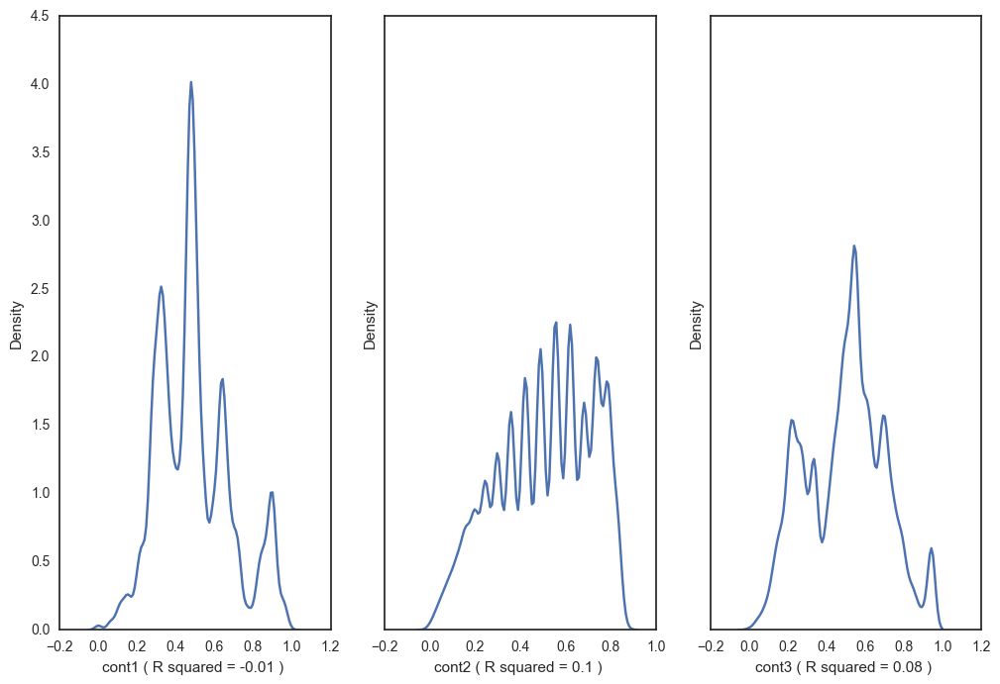

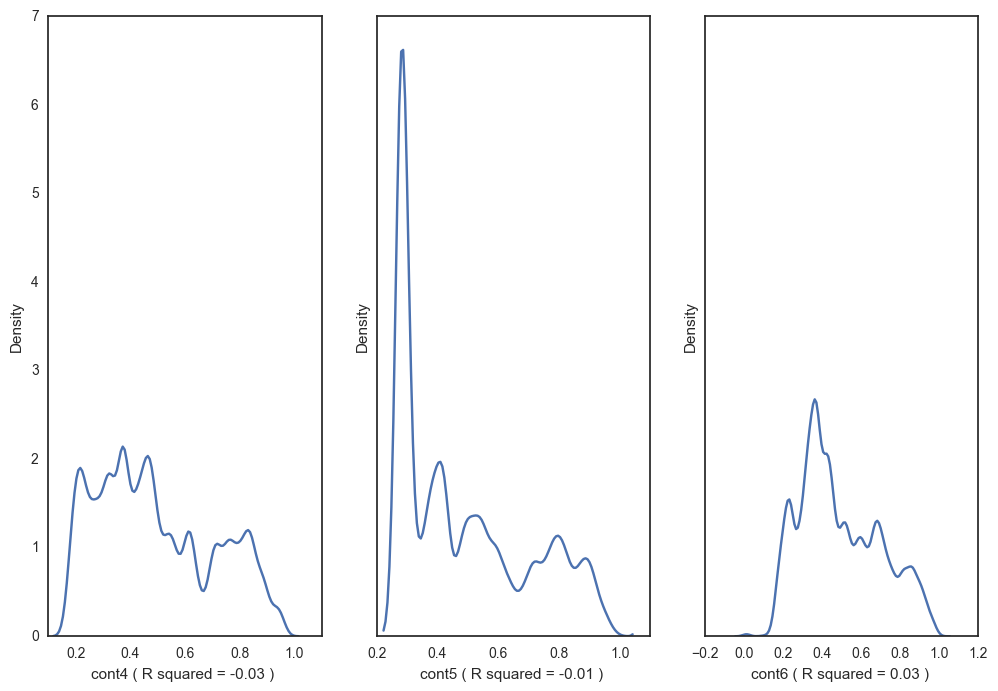

In [44]:
##Density plot for continuous predictors

for i in range(nrow):
    fig,axs = plt.subplots(nrows=1,ncols=ncol,sharey=True,figsize=(12, 8))
    cols = cont_columns[i*ncol:ncol*(i+1)]
    for i in range(len(axs)):
        sns.distplot(train[cols[i]], ax=axs[i], hist=False)
        xlabel=cols[i]+" ( R squared = "+str(round(np.corrcoef(train.loss, train[cols[i]])[0, 1],2))+" ) "
        axs[i].set(xlabel=xlabel, ylabel='Density')

In [45]:
#Correlation between categorical variables

filterG2 = list((train[cat_columns].apply(pd.Series.nunique) == 2))
catFeaturesG2List = [i for (i, v) in zip(cat_columns, filterG2) if v]
catFeaturesG2List.append("loss")

In [48]:
corrCatMatrix = train[catFeaturesG2List].corr().abs()

s = corrCatMatrix.unstack()
sortedSeries= s.sort_values(kind="quicksort",ascending=False)

print("Top 5 most correlated categorical feature pairs: \n")
print(sortedSeries[sortedSeries != 1.0][0:9])

Top 5 most correlated categorical feature pairs: 

Series([], dtype: float64)
